In [47]:
import pandas as pd 
import h2o
from src.encoder_categoricos import MyLabelEncoder
from pycaret.classification import *
from h2o.automl import H2OAutoML
from sklearn import preprocessing
from src.chequeator import chequeator

In [2]:
hospital = pd.read_csv('hospital_train.csv')

In [3]:
hospital

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,161528,6,a,6,X,2,gynecology,R,F,4.0,45810,2.0,Urgent,Moderate,2,21-30,2817.0,0-10
1,159472,23,a,6,X,4,gynecology,Q,F,2.0,128565,15.0,Trauma,Moderate,4,51-60,4498.0,21-30
2,309765,2,c,5,Z,2,anesthesia,S,F,3.0,46565,5.0,Urgent,Moderate,2,71-80,4573.0,11-20
3,279614,32,f,9,Y,3,gynecology,S,B,4.0,124546,6.0,Emergency,Moderate,4,11-20,7202.0,51-60
4,147791,14,a,1,X,3,gynecology,S,E,2.0,22729,8.0,Urgent,Moderate,2,51-60,3398.0,51-60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,237869,12,a,9,Y,3,gynecology,R,B,3.0,82914,3.0,Emergency,Moderate,6,51-60,3966.0,More than 100 Days
99996,254763,28,b,11,X,2,gynecology,R,F,2.0,40026,5.0,Urgent,Moderate,3,21-30,4005.0,51-60
99997,69788,6,a,6,X,3,gynecology,Q,F,3.0,92346,2.0,Trauma,Minor,2,31-40,5215.0,31-40
99998,204442,32,f,9,Y,2,gynecology,S,B,4.0,113798,15.0,Trauma,Moderate,3,41-50,5092.0,11-20


In [4]:
column_meaning = pd.read_csv('columns_meaning.csv')
column_meaning

,Column,Description
0,0,Case_ID registered in Hospital
1,1,Unique code for the Hospital
2,2,Unique code for the type of Hospital
3,3,City Code of the Hospital
4,4,Region Code of the Hospital
5,5,Number of Extra rooms available in the Hospital
6,6,Department overlooking the case
7,7,Code for the Ward type
8,8,Code for the Ward Facility
9,9,Condition of Bed in the Ward


In [5]:
hospital.drop(columns=['10', '8', '0', '4'], inplace=True)

In [6]:
hospital['12'].unique()

array(['Urgent', 'Trauma', 'Emergency'], dtype=object)

In [7]:
le_13 = MyLabelEncoder()
le_13.fit(y=['Minor', 'Moderate', 'Extreme'])

MyLabelEncoder()

In [8]:
hospital['13'] = le_13.transform(hospital['13'])

In [9]:
le_12 = MyLabelEncoder()
le_12.fit(y=['Urgent', 'Trauma', 'Emergency'])
hospital['12'] = le_12.transform(hospital['12'])

In [10]:
le = preprocessing.LabelEncoder()
hospital['2'] = le.fit_transform(hospital['2'])
hospital['6'] = le.fit_transform(hospital['6'])
hospital['7'] = le.fit_transform(hospital['7'])
hospital['15'] = le.fit_transform(hospital['15'])
hospital['17'] = le.fit_transform(hospital['17'])

In [11]:
hospital.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 14 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   1       100000 non-null  int64  
 1   2       100000 non-null  int64  
 2   3       100000 non-null  int64  
 3   5       100000 non-null  int64  
 4   6       100000 non-null  int64  
 5   7       100000 non-null  int64  
 6   9       99967 non-null   float64
 7   11      98517 non-null   float64
 8   12      100000 non-null  int64  
 9   13      100000 non-null  int64  
 10  14      100000 non-null  int64  
 11  15      100000 non-null  int64  
 12  16      100000 non-null  float64
 13  17      100000 non-null  int64  
dtypes: float64(3), int64(11)
memory usage: 10.7 MB


In [12]:
hospital['9'] = hospital['9'].fillna(hospital['9'].median())
hospital['11'] = hospital['11'].fillna(hospital['11'].median())

<AxesSubplot:>

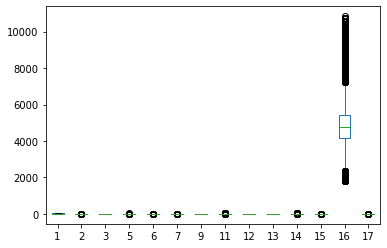

In [13]:
hospital.plot(kind='box')

<AxesSubplot:>

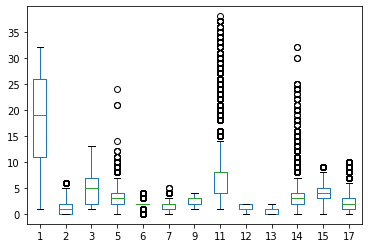

In [14]:
hospital.drop(columns='16').plot(kind='box')

#### quito los otuliers de las columnas no categorigas modificadas con LabelEncoder

In [16]:
hospital_outliers = hospital[['5', '11', '14', '16']]
Q1 = hospital_outliers.quantile(0.25)
Q3 = hospital_outliers.quantile(0.75)
IQR_RIC = Q3 - Q1
limite_inferior = (Q1 - 1.5 * IQR_RIC)
limite_superior = (Q3 + 1.5 * IQR_RIC)
hospital_modelo = hospital[~((hospital_outliers < limite_inferior) | (hospital_outliers > limite_superior)).any(axis=1)]

In [18]:
hospital_modelo

,1,2,3,5,6,7,9,11,12,13,14,15,16,17
0,6,0,6,2,2,2,4.0,2.0,0,1,2,2,2817.0,0
2,2,2,5,2,1,3,3.0,5.0,0,1,2,7,4573.0,1
3,32,5,9,3,2,3,4.0,6.0,2,1,4,1,7202.0,5
4,14,0,1,3,2,3,2.0,8.0,0,1,2,5,3398.0,5
5,32,5,9,3,2,3,2.0,7.0,1,2,4,5,4407.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,14,0,1,4,2,1,3.0,5.0,2,1,4,3,5253.0,2
99995,12,0,9,3,2,2,3.0,3.0,2,1,6,5,3966.0,10
99996,28,1,11,2,2,2,2.0,5.0,0,1,3,2,4005.0,5
99997,6,0,6,3,2,1,3.0,2.0,1,0,2,3,5215.0,3


In [22]:
hospital_modelo_final = hospital_modelo[['5', '6', '7', '9', '12', '13', '14', '15', '17']]


In [23]:
hospital_modelo_final

,5,6,7,9,12,13,14,15,17
0,2,2,2,4.0,0,1,2,2,0
2,2,1,3,3.0,0,1,2,7,1
3,3,2,3,4.0,2,1,4,1,5
4,3,2,3,2.0,0,1,2,5,5
5,3,2,3,2.0,1,2,4,5,3
...,...,...,...,...,...,...,...,...,...
99994,4,2,1,3.0,2,1,4,3,2
99995,3,2,2,3.0,2,1,6,5,10
99996,2,2,2,2.0,0,1,3,2,5
99997,3,2,1,3.0,1,0,2,3,3


In [24]:
hospital_modelo_final.to_csv('hospital_modelo_final.csv')

In [25]:
hospital_modelo['17'].nunique()

11

In [42]:
to_predict = pd.read_csv('hospital_test.csv')

In [30]:
to_predict.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 133744 entries, 0 to 133743
Data columns (total 17 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   0       133744 non-null  int64  
 1   1       133744 non-null  int64  
 2   2       133744 non-null  object 
 3   3       133744 non-null  int64  
 4   4       133744 non-null  object 
 5   5       133744 non-null  int64  
 6   6       133744 non-null  object 
 7   7       133744 non-null  object 
 8   8       133744 non-null  object 
 9   9       133704 non-null  float64
 10  10      133744 non-null  int64  
 11  11      131927 non-null  float64
 12  12      133744 non-null  object 
 13  13      133744 non-null  object 
 14  14      133744 non-null  int64  
 15  15      133744 non-null  object 
 16  16      133744 non-null  float64
dtypes: float64(3), int64(6), object(8)
memory usage: 17.3+ MB


In [36]:
def modificaciones(df):
    df = df.drop(columns=['10', '8', '0', '4'])

    le_13 = MyLabelEncoder()
    le_13.fit(y=['Minor', 'Moderate', 'Extreme'])
    df['13'] = le_13.transform(df['13'])

    le_12 = MyLabelEncoder()
    le_12.fit(y=['Urgent', 'Trauma', 'Emergency'])
    df['12'] = le_12.transform(df['12'])

    le = preprocessing.LabelEncoder()
    df['2'] = le.fit_transform(df['2'])
    df['6'] = le.fit_transform(df['6'])
    df['7'] = le.fit_transform(df['7'])
    df['15'] = le.fit_transform(df['15'])

    df['9'] = df['9'].fillna(df['9'].median())
    df['11'] = df['11'].fillna(df['11'].median())

    return df

In [37]:
hospital_to_predict = modificaciones(to_predict)

#### probar modelos

In [27]:
exp_reg101 = setup(data = hospital_modelo_final, target = '17', session_id=123,  numeric_features = ['5', '6', '7', '14', '15', '12', '13'])

,Description,Value
0,session_id,123
1,Target,17
2,Target Type,Multiclass
3,Label Encoded,"0: 0, 1: 1, 10: 2, 2: 3, 3: 4, 4: 5, 5: 6, 6: 7, 7: 8, 8: 9, 9: 10"
4,Original Data,"(85660, 9)"
5,Missing Values,False
6,Numeric Features,8
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [82]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.3824,0.7217,0.1966,0.3420,0.3393,0.2039,0.2096,11.7760
gbc,Gradient Boosting Classifier,0.3821,0.7222,0.1946,0.3383,0.3326,0.2028,0.2095,26.1630
xgboost,Extreme Gradient Boosting,0.3762,0.7153,0.1953,0.3347,0.3361,0.1968,0.2019,22.6690
lda,Linear Discriminant Analysis,0.3677,0.6939,0.1858,0.2958,0.3100,0.1833,0.1919,0.1410
lr,Logistic Regression,0.3673,0.6969,0.1678,0.2949,0.3134,0.1797,0.1874,13.3100
qda,Quadratic Discriminant Analysis,0.3669,0.7060,0.1742,0.3215,0.3164,0.1798,0.1873,0.0930
nb,Naive Bayes,0.3625,0.6954,0.1624,0.2915,0.3084,0.1701,0.1779,0.0620
ridge,Ridge Classifier,0.3558,0.0000,0.1538,0.2865,0.2768,0.1600,0.1734,0.0670
rf,Random Forest Classifier,0.3417,0.6660,0.1870,0.3099,0.3184,0.1645,0.1666,1.9470
et,Extra Trees Classifier,0.3383,0.6448,0.1856,0.3085,0.3165,0.1607,0.1626,1.7450


In [28]:
gbc = create_model('gbc')
tuned_gbc = tune_model(gbc)
evaluate_model(tuned_gbc)
predict_model(tuned_gbc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.3759,0.7073,0.1636,0.3664,0.3301,0.1777,0.1840
1,0.3914,0.7145,0.1749,0.3907,0.3447,0.1989,0.2058
2,0.3904,0.7061,0.1718,0.3562,0.3442,0.1985,0.2051
3,0.3869,0.7117,0.1688,0.3931,0.3414,0.1950,0.2015
4,0.3993,0.7199,0.1781,0.3712,0.3526,0.2112,0.2180
5,0.3834,0.7130,0.1652,0.3825,0.3382,0.1893,0.1956
6,0.4029,0.7223,0.1758,0.3624,0.3547,0.2158,0.2228
7,0.3921,0.7102,0.1722,0.3941,0.3470,0.2010,0.2073
8,0.3958,0.7185,0.1775,0.3597,0.3500,0.2066,0.2128
9,0.3943,0.7183,0.1684,0.3690,0.3474,0.2044,0.2110


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.3906,0.7155,0.1697,0.3828,0.3434,0.2008,0.2076


,5,6,7,9,12,13,14,15,17,Label,Score
0,2.0,2.0,3.0,4.0,1.0,1.0,2.0,3.0,0,1,0.3081
1,4.0,3.0,1.0,3.0,0.0,0.0,2.0,3.0,1,1,0.3395
2,2.0,2.0,2.0,4.0,0.0,0.0,2.0,0.0,2,1,0.3877
3,2.0,1.0,3.0,2.0,2.0,1.0,4.0,3.0,5,3,0.2748
4,3.0,2.0,1.0,4.0,2.0,1.0,7.0,5.0,3,3,0.2672
...,...,...,...,...,...,...,...,...,...,...,...
25694,2.0,2.0,2.0,3.0,1.0,0.0,2.0,6.0,3,1,0.3749
25695,2.0,2.0,3.0,2.0,2.0,2.0,2.0,3.0,4,1,0.2525
25696,3.0,2.0,2.0,2.0,2.0,1.0,4.0,6.0,4,5,0.2725
25697,3.0,2.0,2.0,2.0,0.0,1.0,4.0,7.0,5,5,0.3506


IntProgress(value=0, description='Processing: ', max=7)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,15:26:55
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Gradient Boosting Classifier


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC


In [38]:
sample = pd.read_csv('sample_submission.csv')

In [39]:
sample

,id,days
0,314114,11-20
1,208989,31-40
2,305872,81-90
3,266099,21-30
4,13228,31-40
...,...,...
133739,318155,41-50
133740,144850,21-30
133741,180676,11-20
133742,39933,21-30


In [43]:
to_predict

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,314114,19,a,7,Y,4,gynecology,S,C,2.0,59278,8.0,Emergency,Minor,2,41-50,4778.0
1,208989,15,c,5,Z,3,gynecology,S,F,2.0,102253,15.0,Trauma,Moderate,3,31-40,5734.0
2,305872,17,e,1,X,4,gynecology,R,E,4.0,5828,4.0,Emergency,Minor,3,71-80,5064.0
3,266099,3,c,3,Z,4,TB & Chest disease,R,A,2.0,56642,9.0,Urgent,Extreme,4,31-40,3254.0
4,13228,6,a,6,X,4,gynecology,R,F,1.0,116266,8.0,Emergency,Minor,3,21-30,4639.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133739,318155,18,d,13,Y,6,anesthesia,Q,B,3.0,123269,25.0,Urgent,Minor,4,51-60,5089.0
133740,144850,27,a,7,Y,2,gynecology,S,C,2.0,1293,8.0,Emergency,Moderate,3,61-70,6713.0
133741,180676,16,c,3,Z,3,gynecology,R,A,3.0,112921,5.0,Trauma,Minor,3,31-40,5326.0
133742,39933,28,b,11,X,4,gynecology,R,F,2.0,585,2.0,Trauma,Extreme,2,31-40,7072.0


In [44]:
final_gbc = finalize_model(tuned_gbc)
save_model(final_gbc,'Final_gbc')
unseen_predictions = predict_model(final_gbc, data=hospital_to_predict)

Transformation Pipeline and Model Succesfully Saved


In [51]:
respuesta = unseen_predictions['Label'].values
respuesta_unlabeled = le.inverse_transform(respuesta)
submission = pd.DataFrame({"id": to_predict['0'], "days": respuesta_unlabeled})
chequeator(submission, sample)
submission.to_csv('resultado.csv', index=False)

You're ready to submit!
